In [68]:
import pandas as pd

In [69]:
df = pd.read_csv('BankChurners.csv')
df.head(10)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.99991
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.99994
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.99998
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.99987
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.99998
5,713061558,Existing Customer,44,M,2,Graduate,Married,$40K - $60K,Blue,36,...,4010.0,1247,2763.0,1.376,1088,24,0.846,0.311,0.000055,0.99994
6,810347208,Existing Customer,51,M,4,Unknown,Married,$120K +,Gold,46,...,34516.0,2264,32252.0,1.975,1330,31,0.722,0.066,0.000123,0.99988
7,818906208,Existing Customer,32,M,0,High School,Unknown,$60K - $80K,Silver,27,...,29081.0,1396,27685.0,2.204,1538,36,0.714,0.048,0.000086,0.99991
8,710930508,Existing Customer,37,M,3,Uneducated,Single,$60K - $80K,Blue,36,...,22352.0,2517,19835.0,3.355,1350,24,1.182,0.113,0.000045,0.99996
9,719661558,Existing Customer,48,M,2,Graduate,Single,$80K - $120K,Blue,36,...,11656.0,1677,9979.0,1.524,1441,32,0.882,0.144,0.000303,0.99970


In [70]:
df.isnull().sum()

CLIENTNUM                                                                                                                             0
Attrition_Flag                                                                                                                        0
Customer_Age                                                                                                                          0
Gender                                                                                                                                0
Dependent_count                                                                                                                       0
Education_Level                                                                                                                       0
Marital_Status                                                                                                                        0
Income_Category                                 

In [71]:
df.duplicated().value_counts()

False    10127
dtype: int64

In [72]:
df = df.drop(columns='CLIENTNUM', axis=1)

In [73]:
df = df.drop(columns=['Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1','Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'], axis=1)
df.head(7)

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
5,Existing Customer,44,M,2,Graduate,Married,$40K - $60K,Blue,36,3,1,2,4010.0,1247,2763.0,1.376,1088,24,0.846,0.311
6,Existing Customer,51,M,4,Unknown,Married,$120K +,Gold,46,6,1,3,34516.0,2264,32252.0,1.975,1330,31,0.722,0.066


In [74]:
df.info()

# Dependent_count = จน คนที่ลูกค้าต้องดูแล(เช่น พ่อจะเปิดบัตร แต่พ่อต้องดูแล ภรรยา ลูกอีก 2 คน รวมเป็น 3 คน) เพื่อที่จะดูว่าลูกค้าสามารถจ่ายค่าบัตรได้หรือไม่
# Months_on_book = จน ระยะเวลาตั้งแต่เปิดบัญชี จนถึงวันที่เก็บข้อมูล
# Total_Relationship_Count = จน บัญชีที่ลูกค้ามี (บัญชีฝากเงิน, สินเชื่อ, บัตรเครดิต และอื่นๆ) ยิ่งลูกค้ามี account ในธนาคารนี้เยอะ ลูกค้าอาจจะไม่เปลี่ยนใจไปธนาคารอื่นได้
# contact_count = จน การติดต่อธุรกิจหรือธนาคารอื่น ถ้าจน การติดต่อกับธนาคารอื่นมาก แสดงว่าลูกค้าอาจจะยกเลิกบัตรจากธนาคารเราได้
# Total_Revolving_Bal = ยอดค้างชำระของบัตร หรืออาจจะเป็นยอดค้างที่มาจากบิลก่อนหน้า
# Avg_Open_To_Buy = จน เครดิตโดยเฉลี่ยที่ผู้กู้มีอยู่เพื่อใช้ในบัญชีเครดิตหมุนเวียน โดยจะคำนวณจากความแตกต่างระหว่างวงเงินสินเชื่อของผู้กู้กับยอดคงค้างปัจจุบันในบัญชีสินเชื่อหมุนเวียน ยิ่งมากยิ่งดี
# Total_Amt_Chng_Q4_Q1 = จน ผลต่างของจำนวนการทำธุรกรรม ใน Q1 กับ Q4 ยิ่งมีค่ามาก แสดงว่าลูกค้ามีการทำธุรกรรมกับบัตรมาก แต่ถ้ามีค่าน้อย ลูกค้าอาจจะยกเลิกบัตรได้
# Total_Trans_Amt = จน เงินรวมของลูกค้าในช่วงเวลาหนึ่ง ยิ่งมากแสดงว่ามีการใช้บัตรมาก 
# Total_Trans_Ct = จน ของธุรกรรมของลูกค้าในช่วงเวลาหนึ่ง 
# Total_Ct_Chng_Q4_Q1 = % ของ transaction ของลูกค้าในช่วงเวลาหนึ่ง 
# Avg_Utilization_Ratio = % ของเงินที่ใช้เทียบกับเครดิต limit 


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

In [75]:
Object_col =[]
for i in df.columns:
    if df[i].dtypes == 'O':
        Object_col.append(i)
Object_col = Object_col[1:]
Object_col

['Gender',
 'Education_Level',
 'Marital_Status',
 'Income_Category',
 'Card_Category']

In [76]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

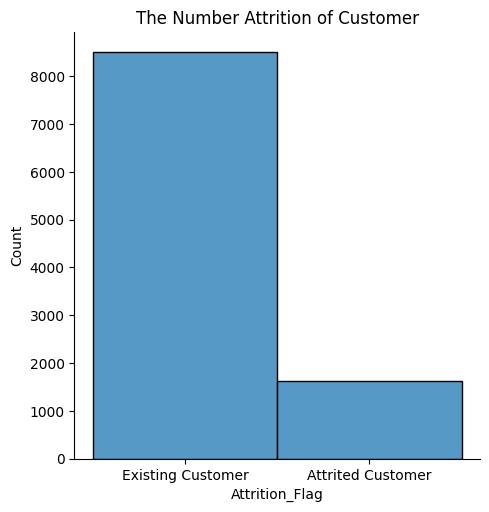

In [77]:
ax1 = sns.displot(x = df['Attrition_Flag'])
ax1.set(title= 'The Number Attrition of Customer')

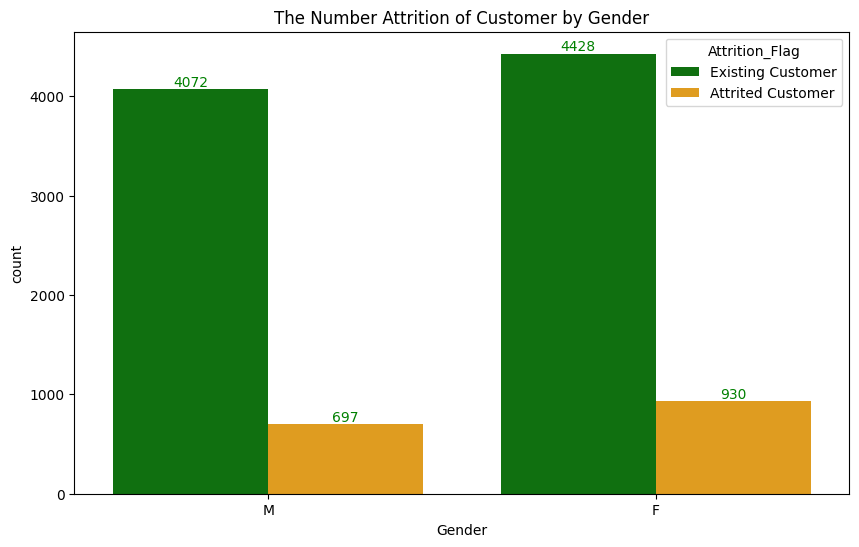

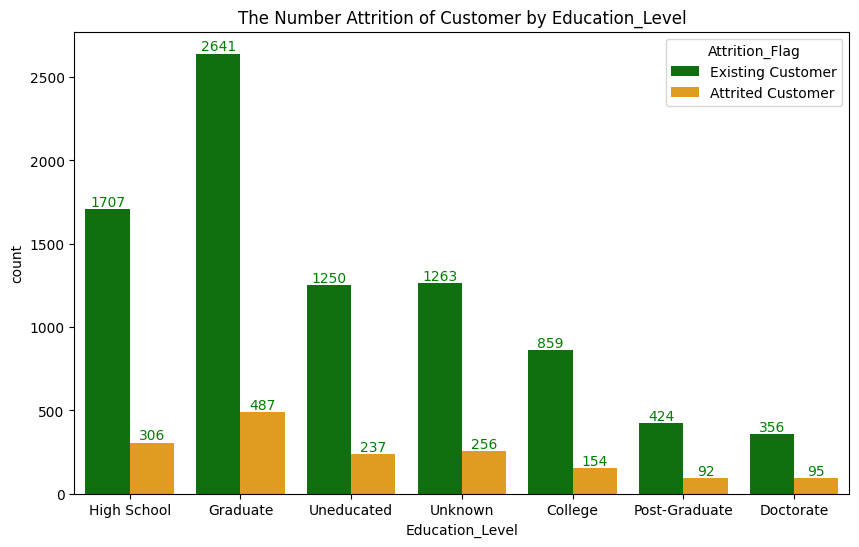

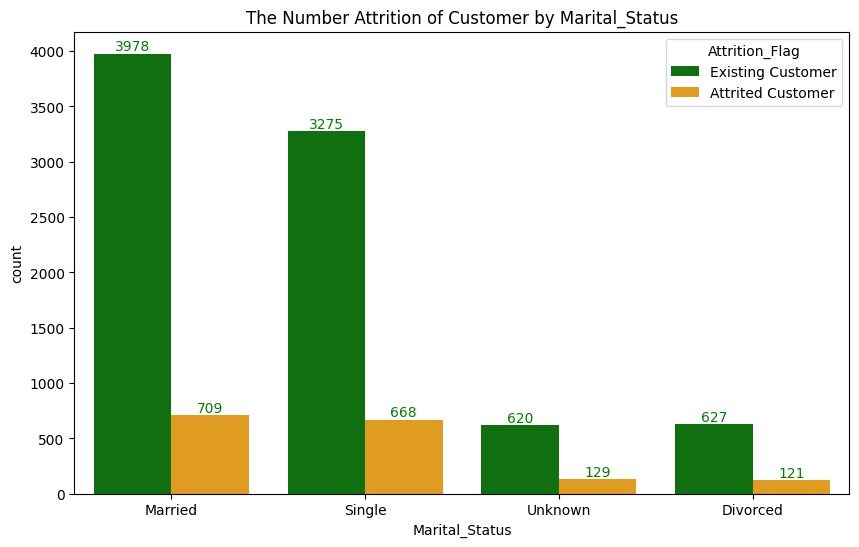

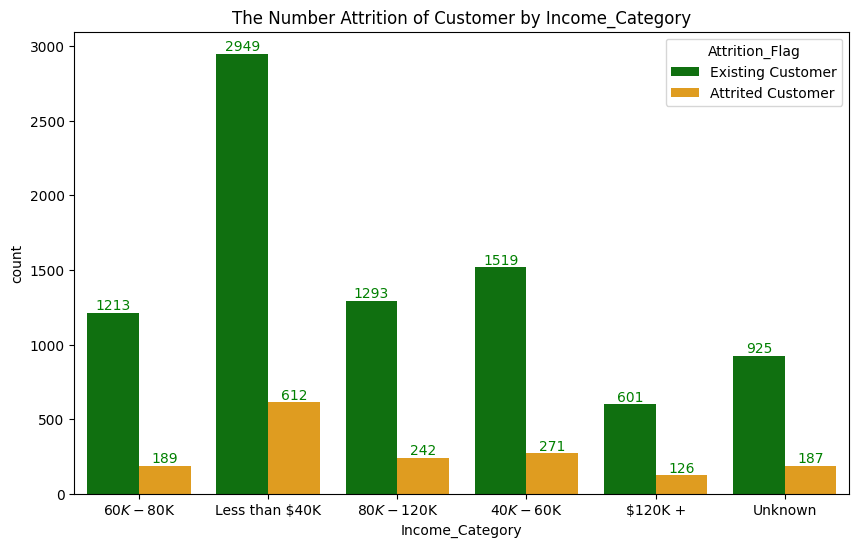

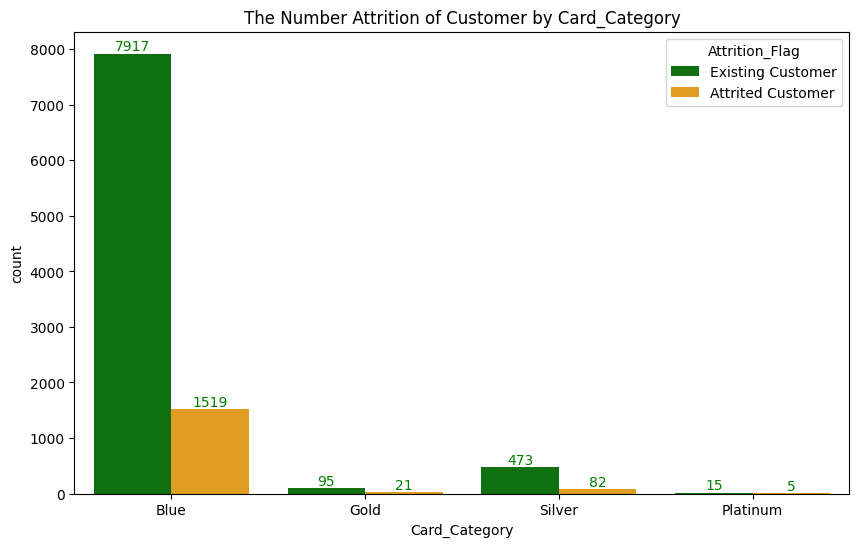

In [78]:
for i in Object_col:
    
    plt.figure(figsize=(10,6))
    ax2 = sns.countplot(data=df, x=i, hue="Attrition_Flag", palette=['green', 'orange'])

    for p in ax2.containers:
        ax2.bar_label(p, label_type='edge', fontsize=10, color= 'green')

    ax2.set(title= 'The Number Attrition of Customer by ' + i)


[Text(0.5, 1.0, 'Count Plot of Attrition Flag by Customer Age'),
 Text(0.5, 0, 'Customer Age'),
 Text(0, 0.5, 'Count')]

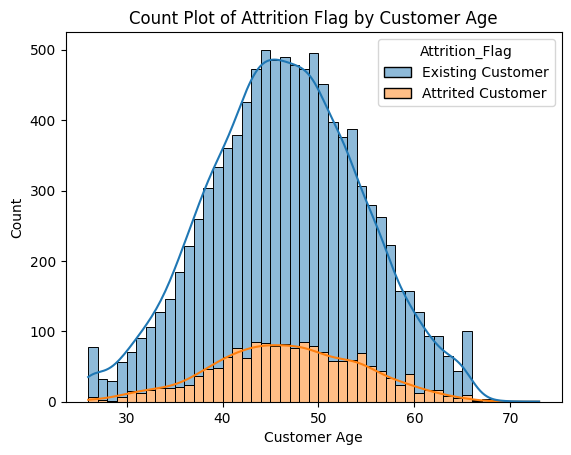

In [79]:
ax = sns.histplot(data=df, x="Customer_Age", hue="Attrition_Flag", multiple="stack", kde=True)

ax.set(title="Count Plot of Attrition Flag by Customer Age", xlabel="Customer Age", ylabel="Count")

[Text(0.5, 1.0, 'Count Plot of Month of Book'),
 Text(0.5, 0, 'Month of Book'),
 Text(0, 0.5, 'Count')]

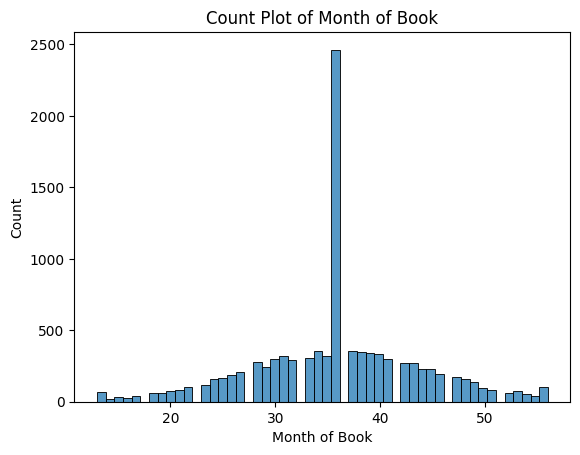

In [66]:
ax = sns.histplot(data=df, x="Months_on_book")

ax.set(title="Count Plot of Month of Book", xlabel="Month of Book", ylabel="Count")

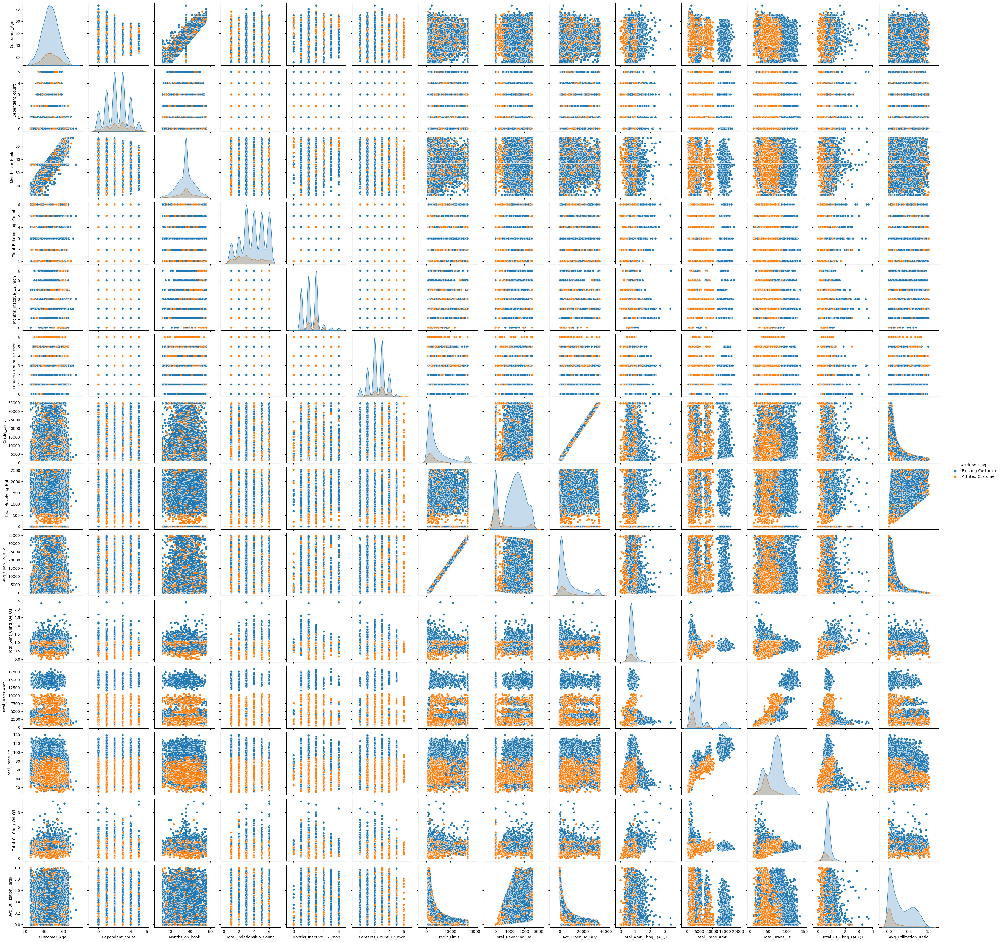

In [67]:
ax = sns.pairplot(data=df, hue="Attrition_Flag")

In [80]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

In [ ]:
df.loc[(df['Attrition_Flag'] == 'Existing Customer'), 'Customer_group'] = 0
df.loc[(df['Attrition_Flag'] == 'Attrited Customer'), 'Customer_group'] = 1

df[['Attrition_Flag','Customer_group']].value_counts()
df['Gender'] = df['Gender'].map({'M': 1, 'F': 0})

In [90]:
from scipy.stats import chi2_contingency

list = []

# create a contingency table
for i in Object_col:
    contingency_table = pd.crosstab(df['Attrition_Flag'], df[i])
    print(contingency_table)
    print("\n")
    # perform chi-square test
    chi2, p, dof, expected = chi2_contingency(contingency_table)

    # print the results
    print('Chi-square statistic:', chi2)
    print('P-value:', p)
    
    if p < 0.05:
        print("There is correlation between Attrition Flag and", i)
        print("\n")
        list.append(i)
    else:
        print("There is no correlation between Attrition Flag and", i)
        print("\n")

Gender                F     M
Attrition_Flag               
Attrited Customer   930   697
Existing Customer  4428  4072


Chi-square statistic: 13.865613700637342
P-value: 0.00019635846717310269
There is correlation between Attrition Flag and Gender


Education_Level    College  Doctorate  Graduate  High School  Post-Graduate  \
Attrition_Flag                                                                
Attrited Customer      154         95       487          306             92   
Existing Customer      859        356      2641         1707            424   

Education_Level    Uneducated  Unknown  
Attrition_Flag                          
Attrited Customer         237      256  
Existing Customer        1250     1263  


Chi-square statistic: 12.51120540483051
P-value: 0.05148913147336627
There is no correlation between Attrition Flag and Education_Level


Marital_Status     Divorced  Married  Single  Unknown
Attrition_Flag                                       
Attrited Customer  

In [91]:
list

['Gender', 'Income_Category']

In [93]:
df.drop(columns=['Education_Level', 'Marital_Status', 'Card_Category'], axis=1, inplace=True)
df

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Income_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,$60K - $80K,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Less than $40K,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,$80K - $120K,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,Less than $40K,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,$60K - $80K,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,Existing Customer,50,M,2,$40K - $60K,40,3,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,Attrited Customer,41,M,2,$40K - $60K,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,Attrited Customer,44,F,1,Less than $40K,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,Attrited Customer,30,M,2,$40K - $60K,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000


In [94]:
df.Income_Category.value_counts()

Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
Unknown           1112
$120K +            727
Name: Income_Category, dtype: int64

In [ ]:
df['Attrition_Flag'] = df['Attrition_Flag'].map({'Attrited Customer': 1, 'Existing Customer': 0})
df['Gender'] = df['Gender'].map({'M': 1, 'F': 0})
df['Income_Category'] = df['Income_Category'].map({'Unknown':0, 'Less than $40K':1, '$40K - $60K':2, '$60K - $80K':3, '$80K - $120K':4, '$120K +':5})


In [97]:
df

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Income_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,0,45,1,3,3,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,0,49,0,5,1,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,0,51,1,3,4,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,0,40,0,4,1,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,0,40,1,3,3,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,0,50,1,2,2,40,3,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,1,41,1,2,2,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,1,44,0,1,1,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,1,30,1,2,2,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000


In [101]:
# Transform the dataset
one_hot = pd.get_dummies(df['Income_Category'],prefix='Income_Category')
df = pd.concat([df, one_hot],axis=1)
df

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Income_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,...,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Income_Category_0,Income_Category_1,Income_Category_2,Income_Category_3,Income_Category_4,Income_Category_5
0,0,45,1,3,3,39,5,1,3,12691.0,...,1144,42,1.625,0.061,0,0,0,1,0,0
1,0,49,0,5,1,44,6,1,2,8256.0,...,1291,33,3.714,0.105,0,1,0,0,0,0
2,0,51,1,3,4,36,4,1,0,3418.0,...,1887,20,2.333,0.000,0,0,0,0,1,0
3,0,40,0,4,1,34,3,4,1,3313.0,...,1171,20,2.333,0.760,0,1,0,0,0,0
4,0,40,1,3,3,21,5,1,0,4716.0,...,816,28,2.500,0.000,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,0,50,1,2,2,40,3,2,3,4003.0,...,15476,117,0.857,0.462,0,0,1,0,0,0
10123,1,41,1,2,2,25,4,2,3,4277.0,...,8764,69,0.683,0.511,0,0,1,0,0,0
10124,1,44,0,1,1,36,5,3,4,5409.0,...,10291,60,0.818,0.000,0,1,0,0,0,0
10125,1,30,1,2,2,36,4,3,3,5281.0,...,8395,62,0.722,0.000,0,0,1,0,0,0


In [102]:
df.drop(columns=['Income_Category'], axis=1, inplace=True)
df

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,...,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Income_Category_0,Income_Category_1,Income_Category_2,Income_Category_3,Income_Category_4,Income_Category_5
0,0,45,1,3,39,5,1,3,12691.0,777,...,1144,42,1.625,0.061,0,0,0,1,0,0
1,0,49,0,5,44,6,1,2,8256.0,864,...,1291,33,3.714,0.105,0,1,0,0,0,0
2,0,51,1,3,36,4,1,0,3418.0,0,...,1887,20,2.333,0.000,0,0,0,0,1,0
3,0,40,0,4,34,3,4,1,3313.0,2517,...,1171,20,2.333,0.760,0,1,0,0,0,0
4,0,40,1,3,21,5,1,0,4716.0,0,...,816,28,2.500,0.000,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,0,50,1,2,40,3,2,3,4003.0,1851,...,15476,117,0.857,0.462,0,0,1,0,0,0
10123,1,41,1,2,25,4,2,3,4277.0,2186,...,8764,69,0.683,0.511,0,0,1,0,0,0
10124,1,44,0,1,36,5,3,4,5409.0,0,...,10291,60,0.818,0.000,0,1,0,0,0,0
10125,1,30,1,2,36,4,3,3,5281.0,0,...,8395,62,0.722,0.000,0,0,1,0,0,0


In [103]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  int64  
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  int64  
 3   Dependent_count           10127 non-null  int64  
 4   Months_on_book            10127 non-null  int64  
 5   Total_Relationship_Count  10127 non-null  int64  
 6   Months_Inactive_12_mon    10127 non-null  int64  
 7   Contacts_Count_12_mon     10127 non-null  int64  
 8   Credit_Limit              10127 non-null  float64
 9   Total_Revolving_Bal       10127 non-null  int64  
 10  Avg_Open_To_Buy           10127 non-null  float64
 11  Total_Amt_Chng_Q4_Q1      10127 non-null  float64
 12  Total_Trans_Amt           10127 non-null  int64  
 13  Total_Trans_Ct            10127 non-null  int64  
 14  Total_

In [104]:
from sklearn.preprocessing import MinMaxScaler

intcols = df.select_dtypes(include = ['int64']).columns
floatcols = df.select_dtypes(include = ['Float64']).columns

# minmax scaling numeric features 
for col in df[floatcols]:
    df[col] = MinMaxScaler().fit_transform(df[[col]])
    
for col in df[intcols]:
    df[col] = MinMaxScaler().fit_transform(df[[col]])

In [105]:
df

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,...,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Income_Category_0,Income_Category_1,Income_Category_2,Income_Category_3,Income_Category_4,Income_Category_5
0,0.0,0.404255,1.0,0.6,0.604651,0.8,0.166667,0.500000,0.340190,0.308701,...,0.035273,0.248062,0.437534,0.061061,0,0,0,1,0,0
1,0.0,0.489362,0.0,1.0,0.720930,1.0,0.166667,0.333333,0.206112,0.343266,...,0.043452,0.178295,1.000000,0.105105,0,1,0,0,0,0
2,0.0,0.531915,1.0,0.6,0.534884,0.6,0.166667,0.000000,0.059850,0.000000,...,0.076611,0.077519,0.628164,0.000000,0,0,0,0,1,0
3,0.0,0.297872,0.0,0.8,0.488372,0.4,0.666667,0.166667,0.056676,1.000000,...,0.036775,0.077519,0.628164,0.760761,0,1,0,0,0,0
4,0.0,0.297872,1.0,0.6,0.186047,0.8,0.166667,0.000000,0.099091,0.000000,...,0.017025,0.139535,0.673129,0.000000,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,0.0,0.510638,1.0,0.4,0.627907,0.4,0.333333,0.500000,0.077536,0.735399,...,0.832647,0.829457,0.230749,0.462462,0,0,1,0,0,0
10123,1.0,0.319149,1.0,0.4,0.279070,0.6,0.333333,0.500000,0.085819,0.868494,...,0.459219,0.457364,0.183899,0.511512,0,0,1,0,0,0
10124,1.0,0.382979,0.0,0.2,0.534884,0.8,0.500000,0.666667,0.120042,0.000000,...,0.544175,0.387597,0.220248,0.000000,0,1,0,0,0,0
10125,1.0,0.085106,1.0,0.4,0.534884,0.6,0.500000,0.500000,0.116172,0.000000,...,0.438689,0.403101,0.194400,0.000000,0,0,1,0,0,0


In [106]:
df.corr()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,...,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Income_Category_0,Income_Category_1,Income_Category_2,Income_Category_3,Income_Category_4,Income_Category_5
Attrition_Flag,1.000000,0.018203,-0.037272,0.018991,0.013687,-0.150005,0.152449,0.204491,-0.023873,-0.263053,...,-0.168598,-0.371403,-0.290054,-0.178410,0.007179,0.022466,-0.011688,-0.028221,-0.003459,0.009584
Customer_Age,0.018203,1.000000,-0.017312,-0.122254,0.788912,-0.010931,0.054361,-0.018452,0.002476,0.014780,...,-0.046446,-0.067097,-0.012143,0.007114,-0.002264,-0.002573,-0.013804,-0.017869,0.005381,0.044332
Gender,-0.037272,-0.017312,1.000000,0.004563,-0.006728,0.003157,-0.011163,0.039987,0.420806,0.029658,...,0.024890,-0.067454,-0.005800,-0.257851,-0.298443,-0.580016,-0.034718,0.424892,0.448017,0.294775
Dependent_count,0.018991,-0.122254,0.004563,1.000000,-0.103062,-0.039076,-0.010768,-0.040505,0.068065,-0.002688,...,0.025046,0.049912,0.011087,-0.037135,-0.019205,-0.046785,-0.013493,0.028975,0.047611,0.024831
Months_on_book,0.013687,0.788912,-0.006728,-0.103062,1.000000,-0.009203,0.074164,-0.010774,0.007507,0.008623,...,-0.038591,-0.049819,-0.014072,-0.007541,-0.007688,-0.004300,-0.003204,-0.016635,0.007720,0.033532
Total_Relationship_Count,-0.150005,-0.010931,0.003157,-0.039076,-0.009203,1.000000,-0.003675,0.055203,-0.071386,0.013726,...,-0.347229,-0.241891,0.040831,0.067663,0.000490,0.005109,-0.008747,0.005475,0.001185,-0.006090
Months_Inactive_12_mon,0.152449,0.054361,-0.011163,-0.010768,0.074164,-0.003675,1.000000,0.029493,-0.020394,-0.042210,...,-0.036982,-0.042787,-0.038989,-0.007503,0.011446,0.018848,-0.021437,-0.004616,-0.005910,-0.002661
Contacts_Count_12_mon,0.204491,-0.018452,0.039987,-0.040505,-0.010774,0.055203,0.029493,1.000000,0.020817,-0.053913,...,-0.112774,-0.152213,-0.094997,-0.055471,0.002195,-0.023255,0.002336,0.000167,0.011473,0.020744
Credit_Limit,-0.023873,0.002476,0.420806,0.068065,0.007507,-0.071386,-0.020394,0.020817,1.000000,0.042493,...,0.171730,0.075927,-0.002020,-0.482965,0.034186,-0.395233,-0.161605,0.093808,0.333828,0.339211
Total_Revolving_Bal,-0.263053,0.014780,0.029658,-0.002688,0.008623,0.013726,-0.042210,-0.053913,0.042493,1.000000,...,0.064370,0.056060,0.089861,0.624022,-0.020578,-0.015974,0.005220,-0.003847,0.022776,0.020264


<AxesSubplot: >

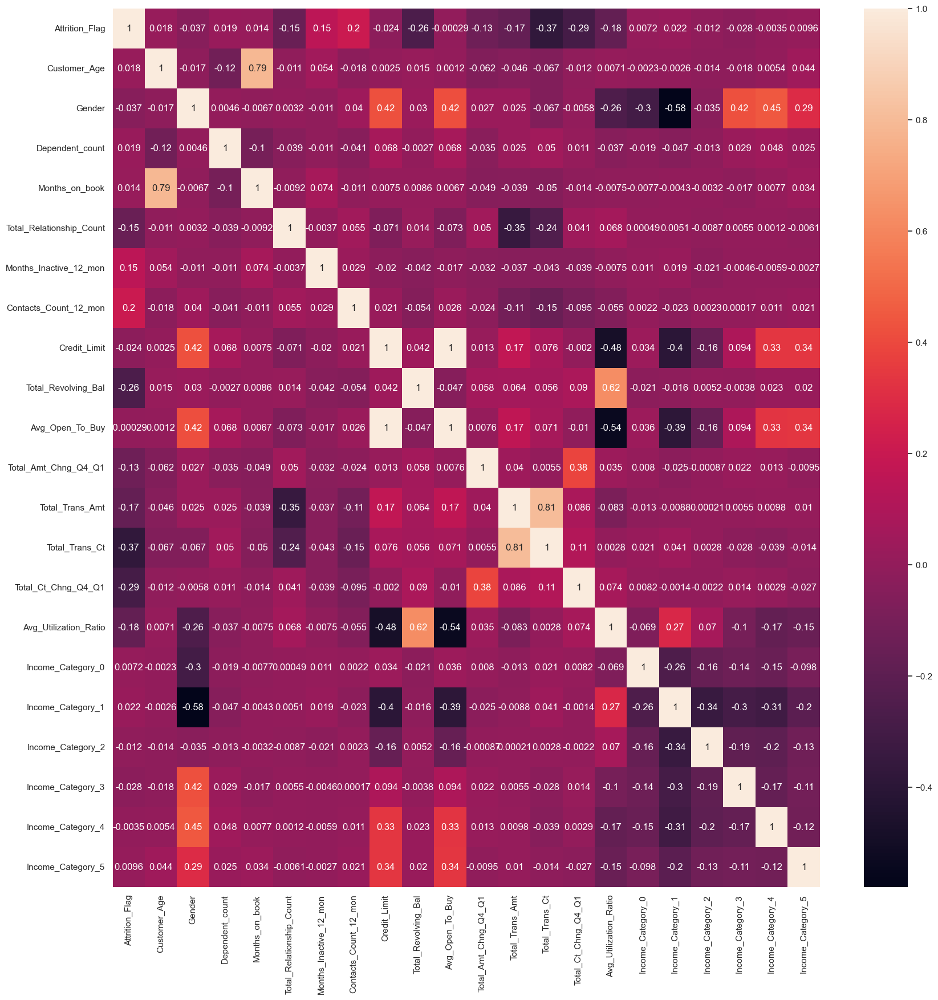

In [107]:
sns.set(rc = {'figure.figsize':(20,20)})
sns.heatmap(data=df.corr(), annot=True)

In [112]:
print("Correlation Coefficient of all the Features")
corr = df.corr()
corr.sort_values(["Attrition_Flag"], ascending = False, inplace = True)
correlations = corr.Attrition_Flag
a = correlations[correlations > 0.1]
b = correlations[correlations < -0.1]
c = abs(correlations[correlations < -0.1])
top_corr_features = a.append(b)
top_corr_features_abs = a.append(c)
top_corr_features_abs = top_corr_features_abs.sort_values(ascending=False)
top_corr_features_abs

Correlation Coefficient of all the Features


C:\Users\z004mbjn\AppData\Local\Temp\ipykernel_524\3176903301.py:9: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  top_corr_features_abs = a.append(c)


Attrition_Flag              1.000000
Total_Trans_Ct              0.371403
Total_Ct_Chng_Q4_Q1         0.290054
Total_Revolving_Bal         0.263053
Contacts_Count_12_mon       0.204491
Avg_Utilization_Ratio       0.178410
Total_Trans_Amt             0.168598
Months_Inactive_12_mon      0.152449
Total_Relationship_Count    0.150005
Total_Amt_Chng_Q4_Q1        0.131063
Name: Attrition_Flag, dtype: float64

In [114]:
top_corr_features

Attrition_Flag              1.000000
Contacts_Count_12_mon       0.204491
Months_Inactive_12_mon      0.152449
Total_Amt_Chng_Q4_Q1       -0.131063
Total_Relationship_Count   -0.150005
Total_Trans_Amt            -0.168598
Avg_Utilization_Ratio      -0.178410
Total_Revolving_Bal        -0.263053
Total_Ct_Chng_Q4_Q1        -0.290054
Total_Trans_Ct             -0.371403
Name: Attrition_Flag, dtype: float64

In [122]:
features = top_corr_features.index.to_list()
features = features[1:]
features


['Contacts_Count_12_mon',
 'Months_Inactive_12_mon',
 'Total_Amt_Chng_Q4_Q1',
 'Total_Relationship_Count',
 'Total_Trans_Amt',
 'Avg_Utilization_Ratio',
 'Total_Revolving_Bal',
 'Total_Ct_Chng_Q4_Q1',
 'Total_Trans_Ct']

In [123]:
X = df[features]
X

,Contacts_Count_12_mon,Months_Inactive_12_mon,Total_Amt_Chng_Q4_Q1,Total_Relationship_Count,Total_Trans_Amt,Avg_Utilization_Ratio,Total_Revolving_Bal,Total_Ct_Chng_Q4_Q1,Total_Trans_Ct
0,0.500000,0.166667,0.392994,0.8,0.035273,0.061061,0.308701,0.437534,0.248062
1,0.333333,0.166667,0.453636,1.0,0.043452,0.105105,0.343266,1.000000,0.178295
2,0.000000,0.166667,0.763615,0.6,0.076611,0.000000,0.000000,0.628164,0.077519
3,0.166667,0.666667,0.413600,0.4,0.036775,0.760761,1.000000,0.628164,0.077519
4,0.000000,0.166667,0.640271,0.8,0.017025,0.000000,0.000000,0.673129,0.139535
...,...,...,...,...,...,...,...,...,...
10122,0.500000,0.333333,0.206947,0.4,0.832647,0.462462,0.735399,0.230749,0.829457
10123,0.500000,0.333333,0.236679,0.6,0.459219,0.511512,0.868494,0.183899,0.457364
10124,0.666667,0.500000,0.241095,0.8,0.544175,0.000000,0.000000,0.220248,0.387597
10125,0.500000,0.500000,0.157492,0.6,0.438689,0.000000,0.000000,0.194400,0.403101


In [124]:
Y = df['Attrition_Flag']
Y

0        0.0
1        0.0
2        0.0
3        0.0
4        0.0
        ... 
10122    0.0
10123    1.0
10124    1.0
10125    1.0
10126    1.0
Name: Attrition_Flag, Length: 10127, dtype: float64

In [125]:
from sklearn.model_selection import train_test_split


# Split the dataset into 80% train and 20% test
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# Split the train dataset into 80% train and 20% validation
X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size=0.2, random_state=42)

# Now we have 64% of train data, 16% of val data and 20% of test data.


In [127]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

# Define the hyperparameters you want to tune
param_grid = {
    'penalty': ['l1', 'l2'], 
    'solver':['lbfgs', 'liblinear'],
    'C': [0.1, 1, 10, 100]
}

# Create a logistic regression model
LR = LogisticRegression()

# Create a GridSearchCV object
LR_CV = GridSearchCV(LR, param_grid, cv=5)

# Fit the GridSearchCV object to the training data
LR_CV.fit(X_val, Y_val)

# Print the best hyperparameters
print("Best hyperparameters: ", LR_CV.best_params_)

Best hyperparameters:  {'C': 100, 'penalty': 'l1', 'solver': 'liblinear'}


c:\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
20 fits failed out of a total of 80.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
20 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py", line 54, in _check_solver
    raise 

In [128]:
#Find the best parameters and accuracy 
print("tuned hpyerparameters :(best parameters) ",LR_CV.best_params_)
print("accuracy :",LR_CV.best_score_)

tuned hpyerparameters :(best parameters)  {'C': 100, 'penalty': 'l1', 'solver': 'liblinear'}
accuracy : 0.9142393162393162


In [129]:
from sklearn.neighbors import KNeighborsClassifier

#KNeighborClassification
parameters = {'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
              'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
              'p': [1,2]}

KNN = KNeighborsClassifier()
KNN_cv = GridSearchCV(KNN, parameters, cv=10)
KNN_cv.fit(X_val, Y_val)

GridSearchCV(cv=10, estimator=KNeighborsClassifier(),
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
                         'p': [1, 2]})

In [130]:
#Find the best parameters and accuracy 
print("tuned hpyerparameters :(best parameters) ",KNN_cv.best_params_)
print("accuracy :",KNN_cv.best_score_)

tuned hpyerparameters :(best parameters)  {'algorithm': 'auto', 'n_neighbors': 5, 'p': 2}
accuracy : 0.9210520336287209


In [132]:
from sklearn.tree import DecisionTreeClassifier

param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

DTC = DecisionTreeClassifier()
DTC_cv = GridSearchCV(DTC, param_grid, cv=10)
DTC_cv.fit(X_val, Y_val)

GridSearchCV(cv=10, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [5, 10, 15],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10]})

In [133]:
#Find the best parameters and accuracy 
print("tuned hpyerparameters :(best parameters) ",DTC_cv.best_params_)
print("accuracy :",DTC_cv.best_score_)

tuned hpyerparameters :(best parameters)  {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 10}
accuracy : 0.9321366356131181


In [136]:
from sklearn.ensemble import RandomForestClassifier

param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [5, 10, 20],
    'min_samples_split': [2, 4, 6]
}

RFC = RandomForestClassifier()
RFC_cv = GridSearchCV(RFC, param_grid, cv=10)
RFC_cv.fit(X_val, Y_val)

GridSearchCV(cv=10, estimator=RandomForestClassifier(),
             param_grid={'max_depth': [5, 10, 20],
                         'min_samples_split': [2, 4, 6],
                         'n_estimators': [100, 200, 300]})

In [137]:
#Find the best parameters and accuracy 
print("tuned hpyerparameters :(best parameters) ",RFC_cv.best_params_)
print("accuracy :",RFC_cv.best_score_)

tuned hpyerparameters :(best parameters)  {'max_depth': 20, 'min_samples_split': 6, 'n_estimators': 100}
accuracy : 0.9531318639703097


In [138]:
from sklearn.ensemble import GradientBoostingClassifier

param_grid = {
    'learning_rate': [0.1, 0.2],
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5]
}

GBC = GradientBoostingClassifier()
GBC_cv = GridSearchCV(GBC, param_grid, cv=10)
GBC_cv.fit(X_val, Y_val)

GridSearchCV(cv=10, estimator=GradientBoostingClassifier(),
             param_grid={'learning_rate': [0.1, 0.2], 'max_depth': [3, 4, 5],
                         'n_estimators': [50, 100, 200]})

In [139]:
#Find the best parameters and accuracy 
print("tuned hpyerparameters :(best parameters) ",GBC_cv.best_params_)
print("accuracy :",GBC_cv.best_score_)

tuned hpyerparameters :(best parameters)  {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50}
accuracy : 0.9586836325077635


In [140]:
# Train data

LR = LogisticRegression(C=1, penalty='l1', solver='liblinear')
LR.fit(X_train,Y_train)
y_pred = LR.predict(X_test)

KNN = KNeighborsClassifier(algorithm='auto', n_neighbors=5, p=2)
KNN.fit(X_train,Y_train)
y_pred2 = KNN.predict(X_test)

DTC = DecisionTreeClassifier(criterion='gini', max_depth=10, min_samples_leaf=2, min_samples_split=10)
DTC.fit(X_train,Y_train)
y_pred3 = DTC.predict(X_test)

RFC = RandomForestClassifier(n_estimators=100, max_depth=20, min_samples_split=6)
RFC.fit(X_train,Y_train)
y_pred4 = RFC.predict(X_test)

GBC = GradientBoostingClassifier(n_estimators=50, max_depth=3, learning_rate=0.2)
GBC.fit(X_train,Y_train)
y_pred5 = GBC.predict(X_test)

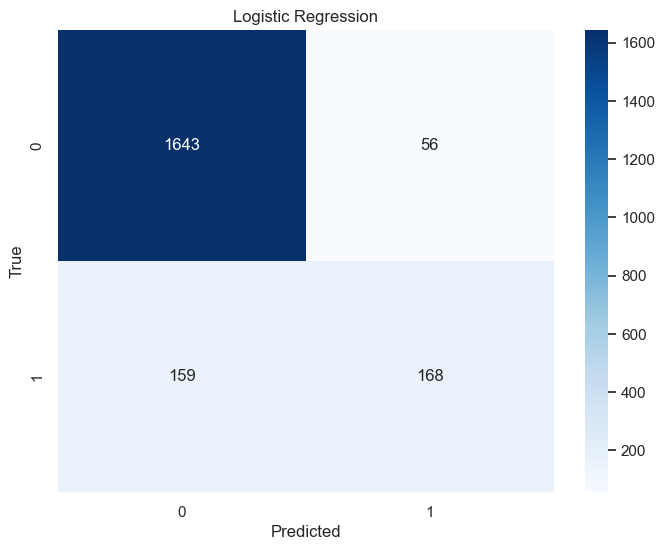

              precision    recall  f1-score   support

         0.0       0.91      0.97      0.94      1699
         1.0       0.75      0.51      0.61       327

    accuracy                           0.89      2026
   macro avg       0.83      0.74      0.77      2026
weighted avg       0.89      0.89      0.89      2026



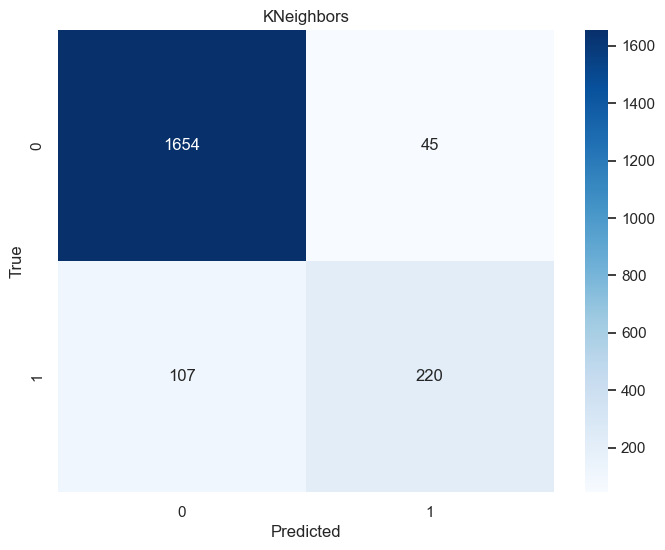

              precision    recall  f1-score   support

         0.0       0.94      0.97      0.96      1699
         1.0       0.83      0.67      0.74       327

    accuracy                           0.92      2026
   macro avg       0.88      0.82      0.85      2026
weighted avg       0.92      0.92      0.92      2026



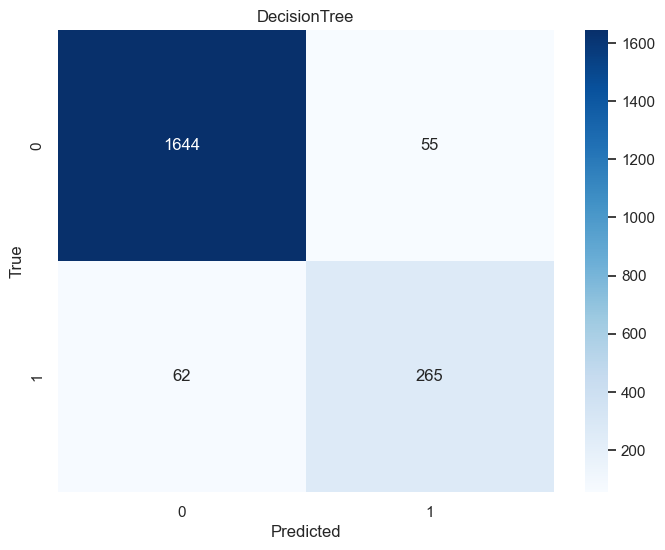

              precision    recall  f1-score   support

         0.0       0.96      0.97      0.97      1699
         1.0       0.83      0.81      0.82       327

    accuracy                           0.94      2026
   macro avg       0.90      0.89      0.89      2026
weighted avg       0.94      0.94      0.94      2026



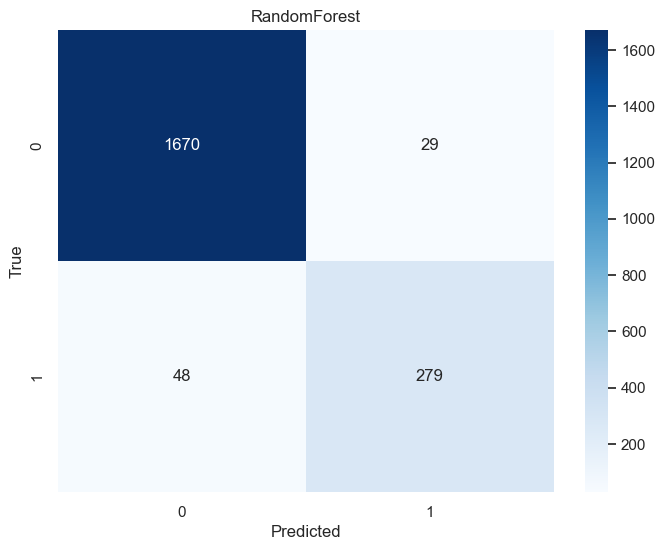

              precision    recall  f1-score   support

         0.0       0.97      0.98      0.98      1699
         1.0       0.91      0.85      0.88       327

    accuracy                           0.96      2026
   macro avg       0.94      0.92      0.93      2026
weighted avg       0.96      0.96      0.96      2026



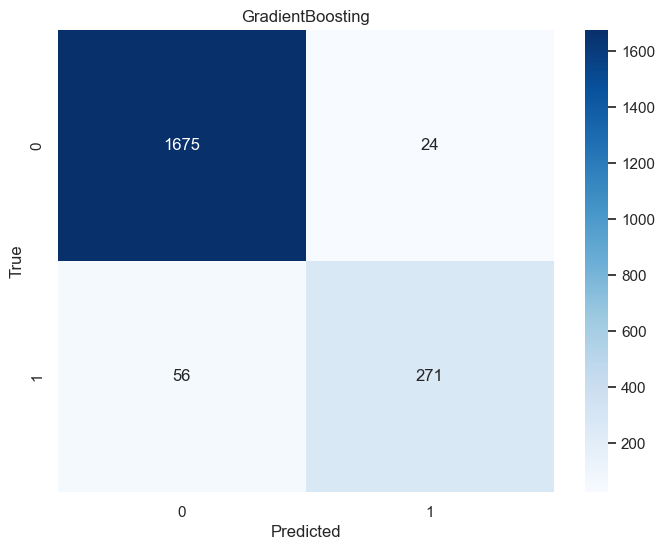

              precision    recall  f1-score   support

         0.0       0.97      0.99      0.98      1699
         1.0       0.92      0.83      0.87       327

    accuracy                           0.96      2026
   macro avg       0.94      0.91      0.92      2026
weighted avg       0.96      0.96      0.96      2026



In [147]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score

models = ['Logistic Regression', 'KNeighbors', 'DecisionTree', 'RandomForest', 'GradientBoosting']
label = [y_pred, y_pred2, y_pred3, y_pred4, y_pred5]

for i in range(5):
    conf_matrix = confusion_matrix(Y_test, label[i])
    plt.figure(figsize=(8,6))
    sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='g')
    plt.title(models[i])
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()
    print(classification_report(Y_test, label[i]))

